In [1]:
#训练数据提取
import warnings
warnings.simplefilter("ignore")
from prepare import train_properties_and_names
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

train_properties, feature_names = train_properties_and_names()
dataset_path = 'data_filled_400.csv'

# read dataset
datas = pd.read_csv(dataset_path)
data = datas.drop(['element1','element2','NO(%)'],axis=1)
target = datas['NO(%)']

x_train, x_test, y_train, y_test = train_test_split(data, target, test_size=0.2, random_state=352)

In [2]:
from prepare import bootstrap_predict_ci
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

xgb0 = XGBRegressor(random_state=0)
xgb1 = XGBRegressor(colsample_bytree=1, eta=0.05, eval_metric='rmse',
                  max_depth=3, n_estimators=400, seed=2, subsample=0.5)
gb0 = GradientBoostingRegressor()
gb1 = GradientBoostingRegressor(learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=3,n_estimators=175, subsample=0.7, random_state=14)
cb0 = CatBoostRegressor(verbose=False)
cb1 = CatBoostRegressor(l2_leaf_reg= 3,learning_rate=0.05,depth=5,iterations = 900,random_state=0,verbose=False)

In [3]:
mean_pred, lower, upper, preds = bootstrap_predict_ci(
    xgb0,
    x_train, y_train,
    x_test,
    n_boot=1000,
    alpha=0.05,
    random_state=42
)

平均CI宽度: 24.148243


cv train R2: 0.472 (+/- 0.120) 

XGB Train mse: 0.00000 | rmse: 0.00011 | mae: 0.00007 | mape: 0.01796 | smape: 0.01796 | r2: 1.00000

XGB Test mse: 0.00647 | rmse: 0.08044 | mae: 0.05818 | mape: 18.71622 | smape: 16.03567 | r2: 0.81577



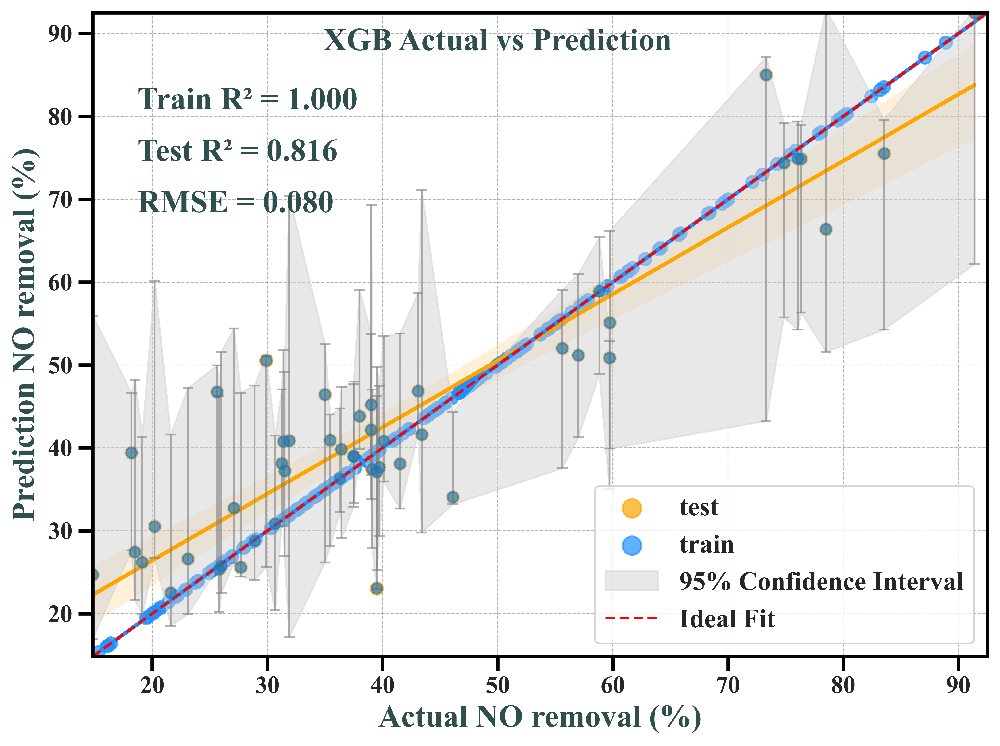

In [4]:
from prepare import draw_scatter,model_performance_metrics,process_regressor
train_pred, test_pred = process_regressor(xgb0, x_train, x_test, y_train, y_test)
model_performance_metrics('XGB Train', y_train, train_pred)
model_performance_metrics('XGB Test', y_test, test_pred)
draw_scatter(y_train, train_pred, y_test,test_pred,
                 title = 'XGB Actual vs Prediction',
                 test_lower=lower, test_upper=upper,
                 train_lower=None, train_upper=None,
                 actual_text='Actual NO removal (%)', pred_text='Prediction NO removal (%)',
                 save=True)

In [5]:
mean_pred, lower, upper, preds = bootstrap_predict_ci(
    xgb1,
    x_train, y_train,
    x_test,
    n_boot=1000,
    alpha=0.05,
    random_state=42
)

平均CI宽度: 18.59268


cv train R2: 0.559 (+/- 0.069) 

XGB Train mse: 0.00056 | rmse: 0.02366 | mae: 0.01848 | mape: 4.72320 | smape: 4.62796 | r2: 0.98172

XGB Test mse: 0.00400 | rmse: 0.06324 | mae: 0.04884 | mape: 15.23135 | smape: 13.32350 | r2: 0.88614



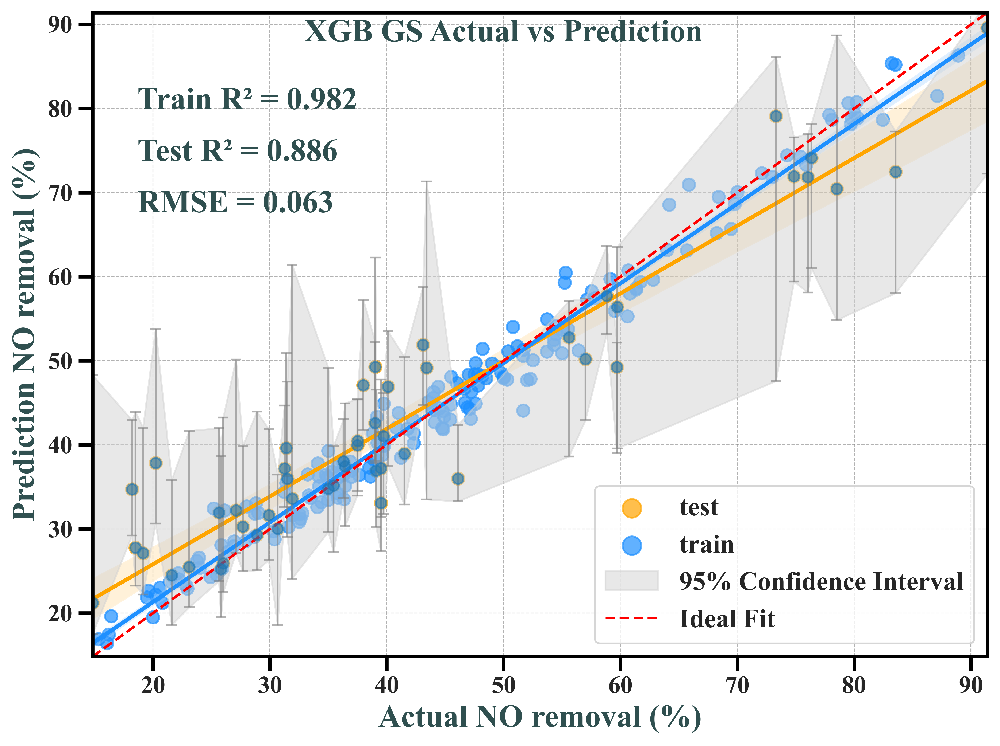

In [6]:
train_pred, test_pred = process_regressor(xgb1, x_train, x_test, y_train, y_test)
model_performance_metrics('XGB Train', y_train, train_pred)
model_performance_metrics('XGB Test', y_test, test_pred)
draw_scatter(y_train, train_pred, y_test,test_pred,
                 title = 'XGB GS Actual vs Prediction',
                 test_lower=lower, test_upper=upper,
                 train_lower=None, train_upper=None,
                 actual_text='Actual NO removal (%)', pred_text='Prediction NO removal (%)',
                 save=True)

In [15]:
mean_pred, lower, upper, preds = bootstrap_predict_ci(
    cb0,
    x_train, y_train,
    x_test,
    n_boot=1000,
    alpha=0.05,
    random_state=42
)

平均CI宽度: 16.73562754502907


cv train R2: 0.573 (+/- 0.048) 

CatBoost Train mse: 0.00018 | rmse: 0.01337 | mae: 0.01049 | mape: 2.61889 | smape: 2.59154 | r2: 0.99416

CatBoost Test mse: 0.00414 | rmse: 0.06437 | mae: 0.05232 | mape: 16.25182 | smape: 14.46584 | r2: 0.88204



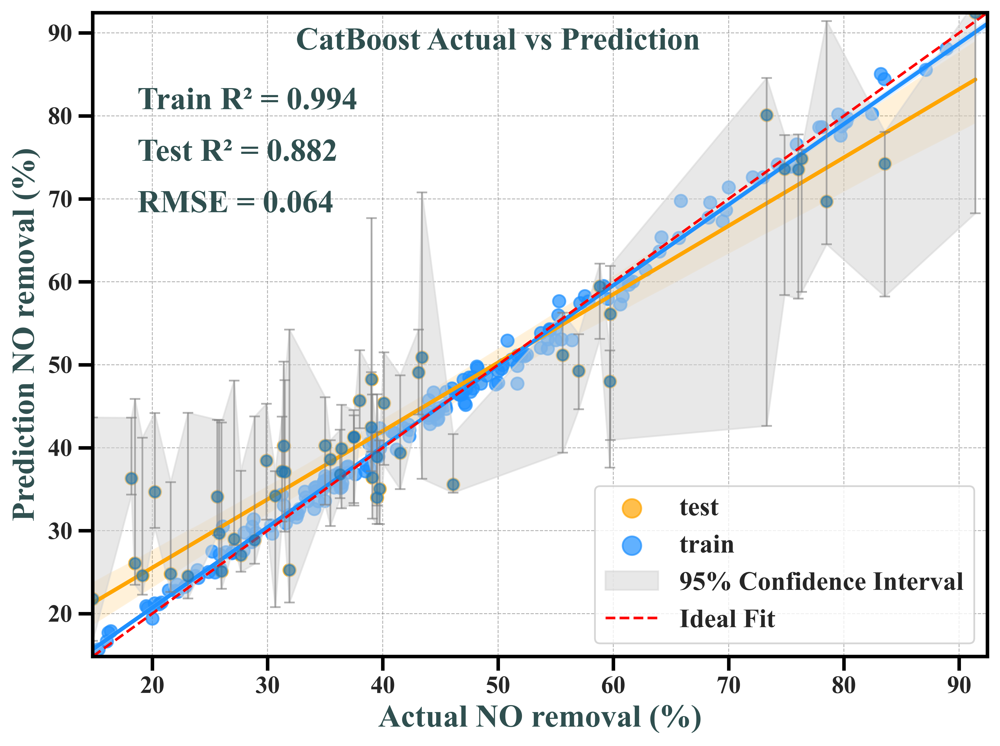

In [16]:
train_pred, test_pred = process_regressor(cb0, x_train, x_test, y_train, y_test)
model_performance_metrics('CatBoost Train', y_train, train_pred)
model_performance_metrics('CatBoost Test', y_test, test_pred)
draw_scatter(y_train, train_pred, y_test,test_pred,
                 title = 'CatBoost Actual vs Prediction',
                 test_lower=lower, test_upper=upper,
                 train_lower=None, train_upper=None,
                 actual_text='Actual NO removal (%)', pred_text='Prediction NO removal (%)',
                 save=True)

In [9]:
mean_pred, lower, upper, preds = bootstrap_predict_ci(
    cb1,
    x_train, y_train,
    x_test,
    n_boot=1000,
    alpha=0.05,
    random_state=42
)

平均CI宽度: 17.85983167037871


cv train R2: 0.560 (+/- 0.051) 

CatBoost Train mse: 0.00015 | rmse: 0.01205 | mae: 0.00944 | mape: 2.35559 | smape: 2.33531 | r2: 0.99526

CatBoost Test mse: 0.00348 | rmse: 0.05896 | mae: 0.04727 | mape: 14.28829 | smape: 12.89395 | r2: 0.90103



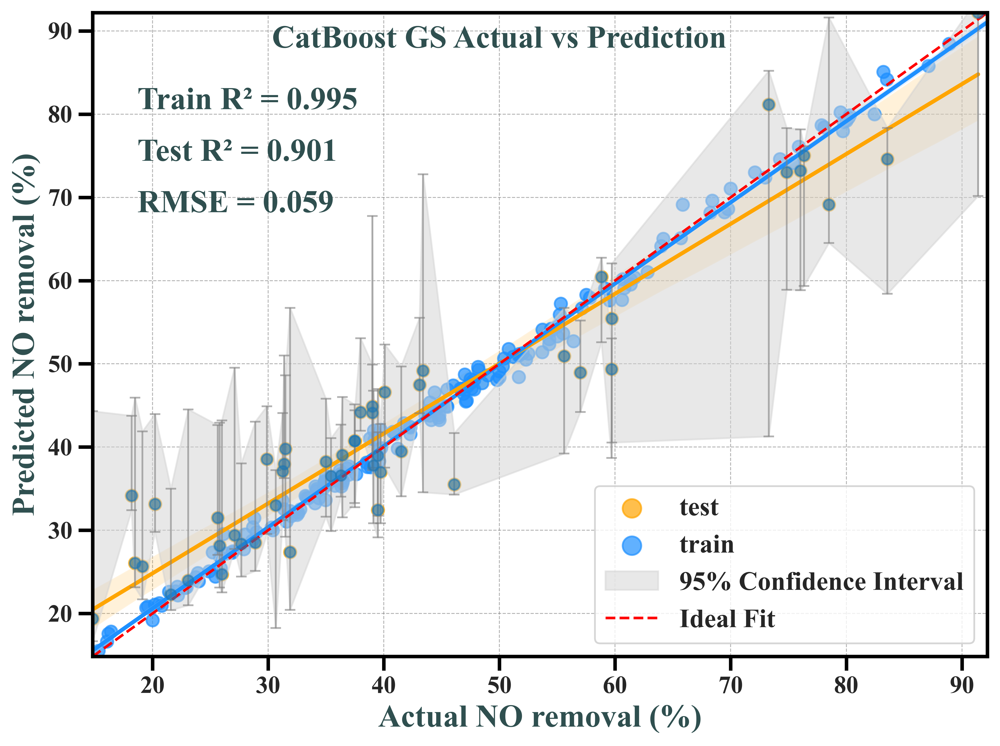

In [10]:
train_pred, test_pred = process_regressor(cb1, x_train, x_test, y_train, y_test)
model_performance_metrics('CatBoost Train', y_train, train_pred)
model_performance_metrics('CatBoost Test', y_test, test_pred)
draw_scatter(y_train, train_pred, y_test,test_pred,
                 title = 'CatBoost GS Actual vs Prediction',
                 test_lower=lower, test_upper=upper,
                 train_lower=None, train_upper=None,
                 actual_text='Actual NO removal (%)', pred_text='Predicted NO removal (%)',
                 save=True)

In [11]:
mean_pred, lower, upper, preds = bootstrap_predict_ci(
    gb1,
    x_train, y_train,
    x_test,
    n_boot=1000,
    alpha=0.05,
    random_state=42
)

平均CI宽度: 19.79279401182838


cv train R2: 0.526 (+/- 0.109) 

GradientBoost Train mse: 0.00001 | rmse: 0.00311 | mae: 0.00254 | mape: 0.64600 | smape: 0.64446 | r2: 0.99968

GradientBoost Test mse: 0.00368 | rmse: 0.06066 | mae: 0.04770 | mape: 14.16267 | smape: 12.85779 | r2: 0.89525



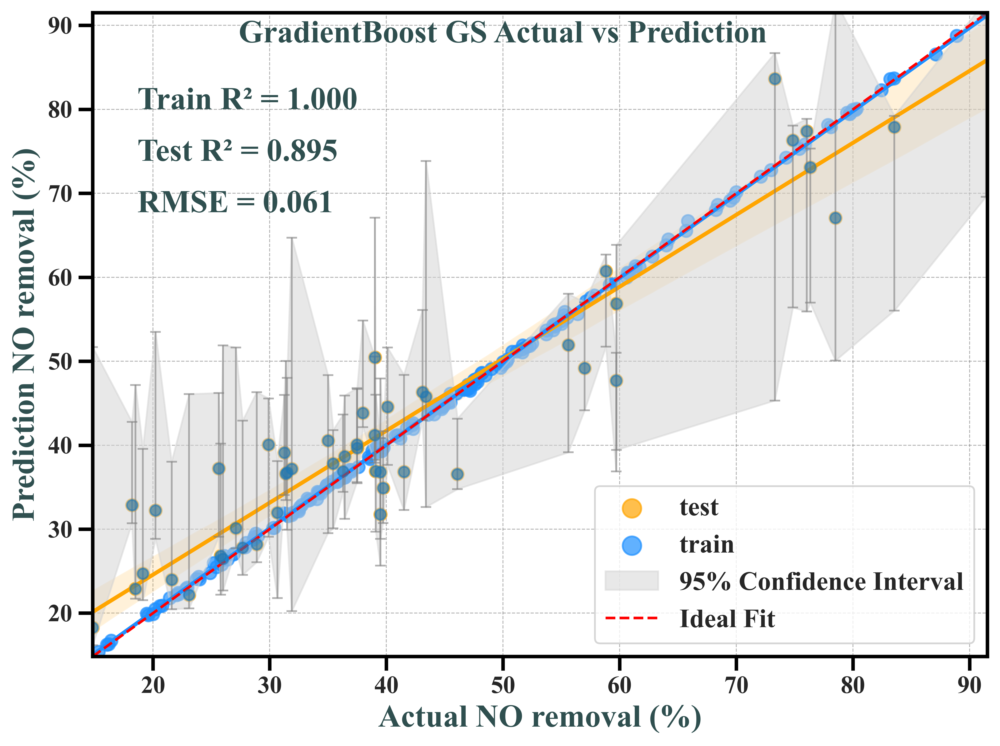

In [12]:
train_pred, test_pred = process_regressor(gb1, x_train, x_test, y_train, y_test)
model_performance_metrics('GradientBoost Train', y_train, train_pred)
model_performance_metrics('GradientBoost Test', y_test, test_pred)
draw_scatter(y_train, train_pred, y_test,test_pred,
                 title = 'GradientBoost GS Actual vs Prediction',
                 test_lower=lower, test_upper=upper,
                 train_lower=None, train_upper=None,
                 actual_text='Actual NO removal (%)', pred_text='Prediction NO removal (%)',
                 save=True)

In [13]:
mean_pred, lower, upper, preds = bootstrap_predict_ci(
    gb0,
    x_train, y_train,
    x_test,
    n_boot=1000,
    alpha=0.05,
    random_state=42
)

平均CI宽度: 20.636566202535878


cv train R2: 0.492 (+/- 0.157) 

GradientBoost Train mse: 0.00142 | rmse: 0.03765 | mae: 0.02903 | mape: 7.79805 | smape: 7.46342 | r2: 0.95371

GradientBoost Test mse: 0.00586 | rmse: 0.07655 | mae: 0.06090 | mape: 19.63435 | smape: 16.63118 | r2: 0.83318



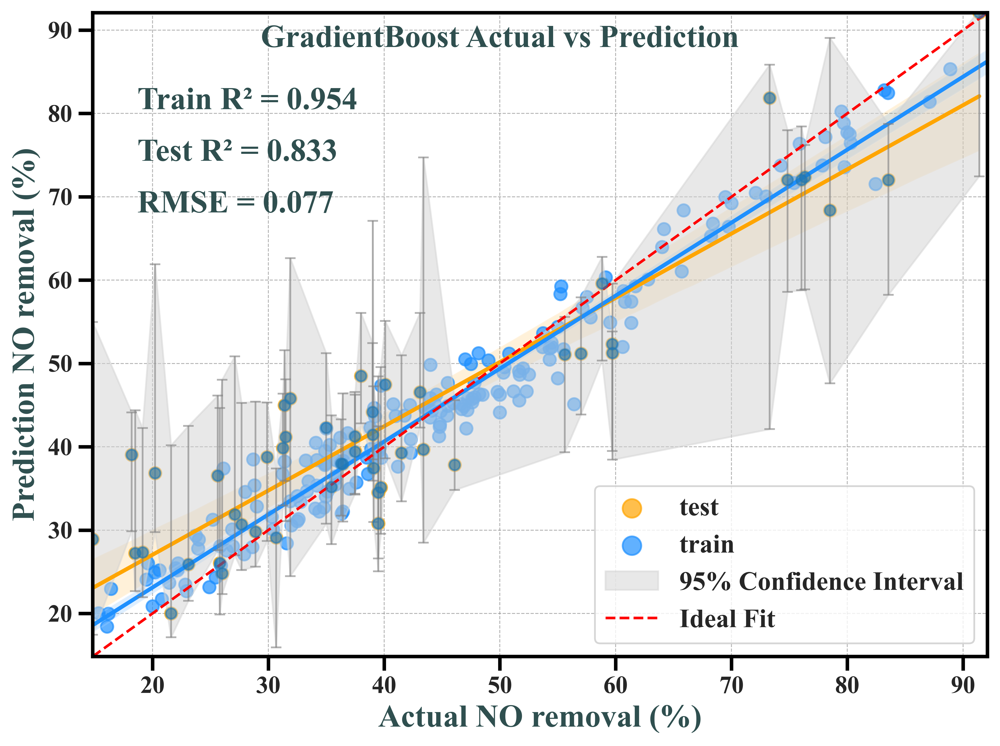

In [14]:
train_pred, test_pred = process_regressor(gb0, x_train, x_test, y_train, y_test)
model_performance_metrics('GradientBoost Train', y_train, train_pred)
model_performance_metrics('GradientBoost Test', y_test, test_pred)
draw_scatter(y_train, train_pred, y_test,test_pred,
                 title = 'GradientBoost Actual vs Prediction',
                 test_lower=lower, test_upper=upper,
                 train_lower=None, train_upper=None,
                 actual_text='Actual NO removal (%)', pred_text='Prediction NO removal (%)',
                 save=True)